# Trying implement Blending 2 images with masks.

In [58]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# reduse operation

In [59]:
def convolution_1d(in_signal: np.ndarray, k_size: np.ndarray) -> np.ndarray:
    """
    Convolve a 1-D array with a given kernel
    :param in_signal: 1-D array
    :param k_size: 1-D array as a kernel
    :return: The convolved array
    """
    k_size = np.flipud(k_size)
    size_signal = in_signal.size
    size_kernel = k_size.size
    size_output = size_signal + size_kernel - 1
    output = np.zeros(size_output)

    #For padding - tooked from claud
    padded_signal = np.pad(in_signal, (size_kernel - 1, size_kernel - 1), mode='constant', constant_values=0)
    for i in range(size_output):
        curr = padded_signal[i:i + size_kernel]
        output[i] = np.sum(curr * k_size)
    return output
def convolution_2d(in_image: np.ndarray, kernel: np.ndarray) -> np.ndarray:
    """
    Convolve a 2-D array with a given kernel
    :param in_image: 2D image
    :param kernel: A kernel
    :return: The convolved image
    """
    kernel = np.flipud(np.fliplr(kernel))
    height_kernel, width_kernel = kernel.shape
    heigh_img, width_img = in_image.shape

    heigh_pad = height_kernel // 2
    width_pad = width_kernel // 2

    padded_image = cv2.copyMakeBorder(in_image, heigh_pad, heigh_pad, width_pad, width_pad, cv2.BORDER_REPLICATE)

    output = np.zeros_like(in_image)
    for i in range(heigh_img):
        for j in range(width_img):
            curr_img = padded_image[i:i + height_kernel, j:j + width_kernel]
            output[i, j] = np.sum(curr_img * kernel)

    return output


# Bluring

In [60]:
def create_gausian_kernel(size: int) -> np.ndarray:
    if size % 2 == 0:
        size += 1
    kernel = np.array([1, 1])
    for i in range(size - 2):
        kernel = convolution_1d(kernel, np.array([1, 1]))
    kernel = kernel / np.sum(kernel)
    kernel = np.outer(kernel, kernel)
    return kernel

def create_average_kernel(size: int) -> np.ndarray:
    if size % 2 == 0:
        size += 1
    kernel=np.zeros((size, size)).astype(np.float32)
    for i in range(size):
        for j in range(size):
            kernel[i, j] = 1/(size*size)
    return kernel


def blur_image_with_gausian(in_image: np.ndarray, k_size: int) -> np.ndarray:
    """
    bluring with gausian kernel
    :param in_image:
    :param k_size:
    :return: the bluring image
    """
    kernel = create_gausian_kernel(k_size)
    output = convolution_2d(in_image, kernel)
    return output

def blur_image_with_average(in_image: np.ndarray, k_size: int) -> np.ndarray:
    """
    bluring with average kernel
    :param in_image:
    :param k_size:
    :return: the bluring image
    """
    kernel = create_average_kernel(k_size)
    output = convolution_2d(in_image, kernel)
    return output


In [61]:
def blur_image_color_with_gausian(in_image: np.ndarray, k_size: int) -> np.ndarray:
    if len(in_image.shape) == 2:
        return blur_image_with_gausian(in_image, k_size)
    output = np.zeros_like(in_image)
    for i in range(in_image.shape[2]):
        output[:, :, i] = blur_image_with_gausian(in_image[:, :, i], k_size)
    return output

def blur_image_color_with_average(in_image: np.ndarray, k_size: int) -> np.ndarray:
    if len(in_image.shape) == 2:
        return blur_image_with_average(in_image, k_size)
    output = np.zeros_like(in_image)
    for i in range(in_image.shape[2]):
        output[:, :, i] = blur_image_with_average(in_image[:, :, i], k_size)
    return output

# Example of Picture Blurring with gausian kernel

In [62]:
image=cv2.imread('inputs/image_for_blurring.png', cv2.IMREAD_COLOR)
img_blur_one_time=blur_image_color_with_gausian(image, 15)
img_blur_second_time=blur_image_color_with_gausian(img_blur_one_time, 15)
img_blur_three_time=blur_image_color_with_gausian(img_blur_second_time, 15)
image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img_blur_one_time=cv2.cvtColor(img_blur_one_time, cv2.COLOR_BGR2RGB)
img_blur_second_time=cv2.cvtColor(img_blur_second_time, cv2.COLOR_BGR2RGB)
img_blur_three_time=cv2.cvtColor(img_blur_three_time, cv2.COLOR_BGR2RGB)


Showing the result

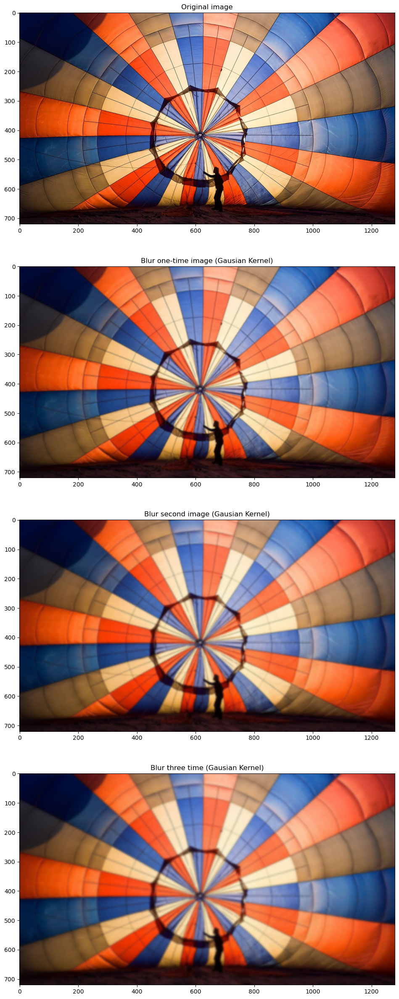

In [63]:
plt.figure(figsize=(30, 30))
plt.subplot(4, 1, 1)
plt.imshow(image)
plt.title('Original image')
plt.subplot(4, 1, 2)
plt.imshow(img_blur_one_time)
plt.title('Blur one-time image (Gausian Kernel)')
plt.subplot(4, 1, 3)
plt.imshow(img_blur_second_time)
plt.title('Blur second image (Gausian Kernel)')
plt.subplot(4, 1, 4)
plt.imshow(img_blur_three_time)
plt.title('Blur three time (Gausian Kernel)')
plt.show()

Showing the differences between the pictures - The amount of information that we lost

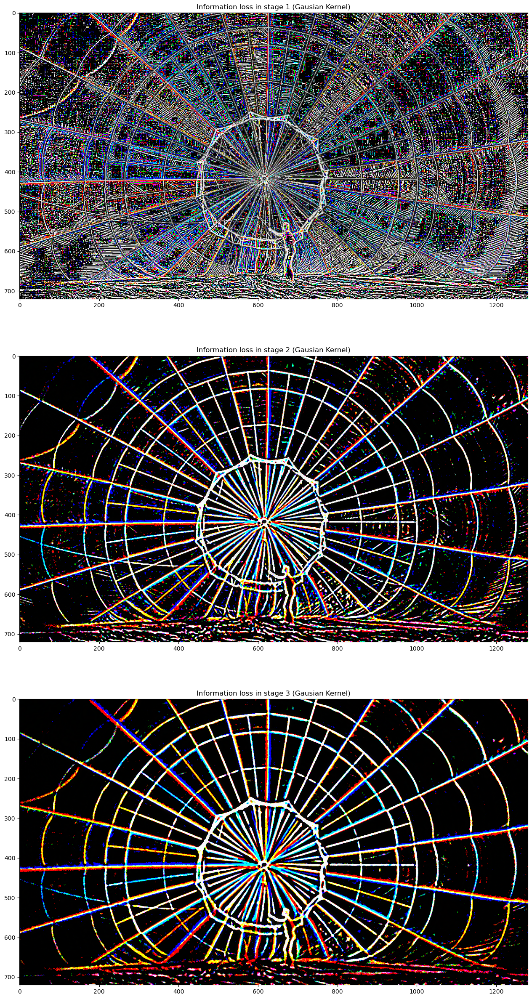

In [64]:
plt.figure(figsize=(30, 30))
plt.subplot(3, 1, 1)
plt.imshow(image-img_blur_one_time)
plt.title('Information loss in stage 1 (Gausian Kernel)')
plt.subplot(3, 1, 2)
plt.imshow(img_blur_one_time-img_blur_second_time)
plt.title('Information loss in stage 2 (Gausian Kernel)')
plt.subplot(3, 1, 3)
plt.imshow((img_blur_second_time-img_blur_three_time))
plt.title('Information loss in stage 3 (Gausian Kernel)')
plt.show()

# Example of Picture Blurring with average kernel

In [65]:
image=cv2.imread('inputs/image_for_blurring.png', cv2.IMREAD_COLOR)
img_blur_one_time=blur_image_color_with_average(image, 15)
img_blur_second_time=blur_image_color_with_average(img_blur_one_time, 15)
img_blur_three_time=blur_image_color_with_average(img_blur_second_time, 15)
image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img_blur_one_time=cv2.cvtColor(img_blur_one_time, cv2.COLOR_BGR2RGB)
img_blur_second_time=cv2.cvtColor(img_blur_second_time, cv2.COLOR_BGR2RGB)
img_blur_three_time=cv2.cvtColor(img_blur_three_time, cv2.COLOR_BGR2RGB)

Showing the result

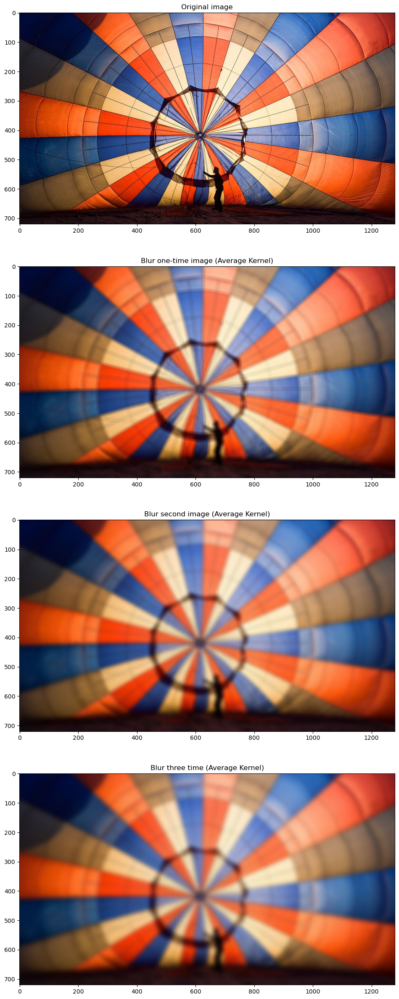

In [66]:
plt.figure(figsize=(30, 30))
plt.subplot(4, 1, 1)
plt.imshow(image)
plt.title('Original image')
plt.subplot(4, 1, 2)
plt.imshow(img_blur_one_time)
plt.title('Blur one-time image (Average Kernel)')
plt.subplot(4, 1, 3)
plt.imshow(img_blur_second_time)
plt.title('Blur second image (Average Kernel)')
plt.subplot(4, 1, 4)
plt.imshow(img_blur_three_time)
plt.title('Blur three time (Average Kernel)')
plt.show()

Showing the differences between the pictures - The amount of information that we lost

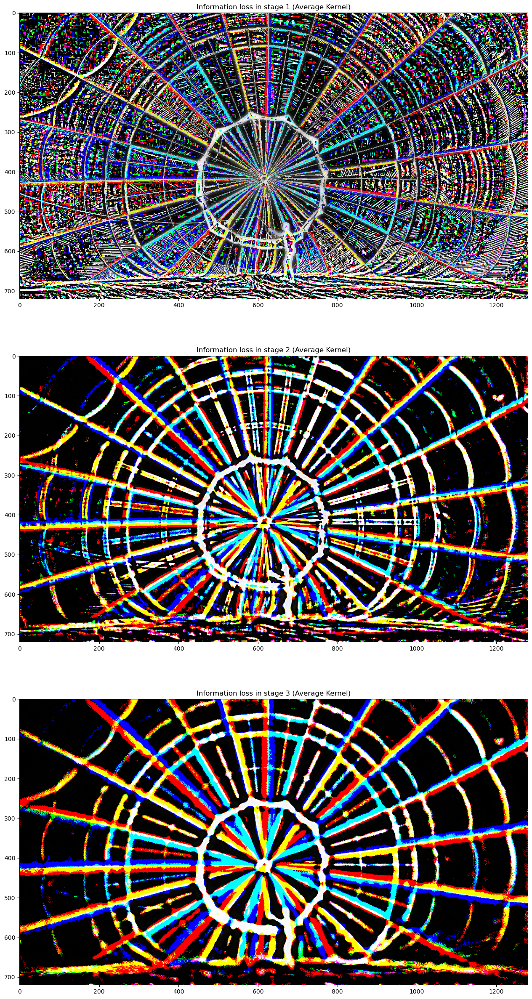

In [67]:
plt.figure(figsize=(30, 30))
plt.subplot(3, 1, 1)
plt.imshow(image-img_blur_one_time)
plt.title('Information loss in stage 1 (Average Kernel)')
plt.subplot(3, 1, 2)
plt.imshow(img_blur_one_time-img_blur_second_time)
plt.title('Information loss in stage 2 (Average Kernel)')
plt.subplot(3, 1, 3)
plt.imshow((img_blur_second_time-img_blur_three_time))
plt.title('Information loss in stage 3 (Average Kernel)')
plt.show()

Note: Here we can see that the important information is stay for more long than the less important